# Load post and reviews data from Inside Airbnb

In [10]:
import pandas as pd

list_path = 'data/listings.csv.gz' # list of Airbnb posts

df_list = pd.read_csv(list_path, compression='gzip')
print(len(df_list))
display(df_list.head())

6974


,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,103760,https://www.airbnb.com/rooms/103760,20250621143218,2025-06-21,city scrape,Central Centre 5 min walk to/from Central MTR,"Located right in the heart of Central, this 2 ...",NaN,https://a0.muscache.com/pictures/815221/056993...,304876,...,4.63,4.72,4.41,NaN,f,1,1,0,0,1.85
1,248140,https://www.airbnb.com/rooms/248140,20250621143218,2025-06-21,city scrape,Bright Studio - Soho - Central HK,Our bright studio apartment is perfect for vis...,The local neighbourhood is quiet and relaxing....,https://a0.muscache.com/pictures/4e5463bc-38be...,1300549,...,4.97,4.75,4.79,NaN,f,1,1,0,0,1.36
2,263081,https://www.airbnb.com/rooms/263081,20250621143218,2025-06-21,city scrape,"3 睡房, 2500 平方呎 有工人 Family Friendly! 在中環半山 有車","Mid Level on the top of central, Next to the m...","We are in the most luxury area of HK, conduit ...",https://a0.muscache.com/pictures/7348025/73278...,1370155,...,NaN,NaN,NaN,NaN,f,1,0,1,0,NaN
3,306515,https://www.airbnb.com/rooms/306515,20250621143218,2025-06-21,city scrape,"HongKong,Central Bright Double Room",NaN,NaN,https://a0.muscache.com/pictures/3335548/00a8d...,1576511,...,4.84,4.89,4.79,NaN,f,1,1,0,0,0.12
4,378047,https://www.airbnb.com/rooms/378047,20250621143218,2025-06-21,city scrape,LUXURY HONG KONG COUNTRY COW SHED,Your bijoux getaway is a one story cottage in ...,"We are in the South Lantau foot hills, 20 min ...",https://a0.muscache.com/pictures/hosting/Hosti...,1805628,...,4.94,4.51,4.62,NaN,f,1,1,0,0,0.52


In [36]:
df_list.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'source', 'name',
       'description', 'neighborhood_overview', 'picture_url', 'host_id',
       'host_url', 'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'ca

In [12]:
review_path = 'data/reviews.csv.gz' # review of the posts, link to the listings.csv.gz by listing_id

df_review = pd.read_csv(review_path, compression='gzip')
print(len(df_review))
display(df_review.head())

109940


,listing_id,id,date,reviewer_id,reviewer_name,comments
0,103760,322244,2011-06-19,601908,Kathleen,We had a great experience staying in this apar...
1,103760,352385,2011-07-04,342534,Lynne,This apartment is in a fabulous location - wal...
2,103760,360538,2011-07-08,90756,Camille,Pretty good little apartment. Just a really gr...
3,103760,378028,2011-07-17,682631,Tan,The apartment was exactly the same as the phot...
4,103760,390313,2011-07-23,615474,Ann_Aun,The apartment is very clean and has everything...


In [24]:
import folium
import geopandas as gpd

# Load neighbourhood boundaries from GeoJSON file
neighborhoods = gpd.read_file('data/neighbourhoods.geojson')

# Load Airbnb listings data from compressed CSV file
listings = pd.read_csv('data/listings.csv.gz', compression='gzip')

# Set the initial map center coordinates (approximate center of Hong Kong)
center_lat, center_lon = 22.32, 114.17
m = folium.Map(
    location=[center_lat, center_lon], 
    zoom_start=11,
    tiles='CartoDB Positron'
)

# Add neighbourhood polygons to the map with styling
folium.GeoJson(
    neighborhoods,
    name='Neighbourhoods',
    tooltip=folium.GeoJsonTooltip(fields=['neighbourhood'], aliases=['Name:']),
    style_function=lambda feature: {
        'fillColor': '#ffff00',  # Yellow fill
        'color': 'blue',         # Blue boundary line
        'weight': 1,
        'fillOpacity': 0.1,      # Transparent fill
    }
).add_to(m)

# Plot each Airbnb listing as a red circle marker on the map
for idx, row in listings.iterrows():
    lat = row['latitude']
    lon = row['longitude']
    if pd.notna(lat) and pd.notna(lon):
        folium.CircleMarker(
            location=[lat, lon],
            radius=1,
            color='red',
            fill=True,
            fill_opacity=0.2,
            popup=f"Name: {row.get('name', 'N/A')}"  # Popup shows listing name
        ).add_to(m)

# Add layer control to toggle neighbourhood polygons visibility
folium.LayerControl().add_to(m)
m

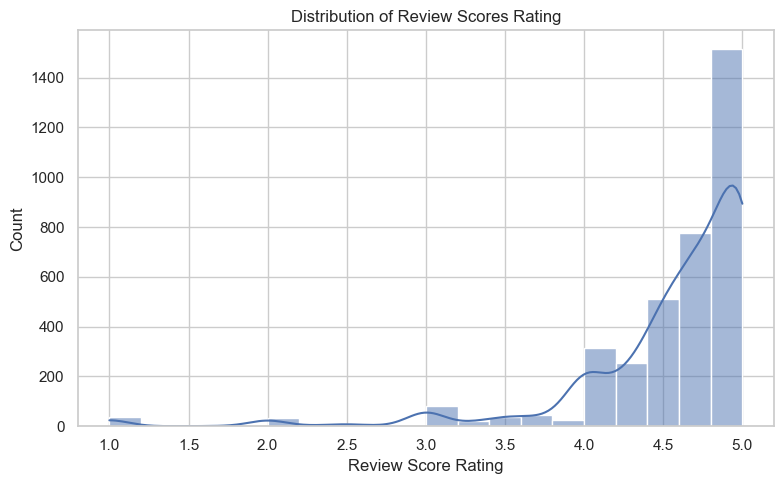

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set plot style
sns.set(style="whitegrid")

# Drop missing values in review_scores_rating
ratings = df_list['review_scores_rating'].dropna()

# Plot histogram
plt.figure(figsize=(8, 5))
sns.histplot(ratings, bins=20, kde=True)

plt.title("Distribution of Review Scores Rating")
plt.xlabel("Review Score Rating")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

## Initialize and test LLM API

In [25]:
import getpass
import os

if not os.getenv("DEEPSEEK_API_KEY"):
    os.environ["DEEPSEEK_API_KEY"] = getpass.getpass("Enter your DeepSeek API key: ")

Enter your DeepSeek API key:  ········


In [26]:
from langchain_deepseek import ChatDeepSeek

llm = ChatDeepSeek(
    model="deepseek-chat",
    temperature=0.5,
    max_tokens=2048,          
    timeout=30,                
    max_retries=3,             
)

# Helper function to call LLM and display result
def ask_llm(prompt):
    print(f"\n📌 Prompt:\n{prompt}\n")
    for chunk in llm.stream(prompt):
        print(chunk.text(), end="")
    print("\n")

def generate_multiple_outputs(prompt, temperature=1.0, num_outputs=3):
    # build a new llm object
    llm_temp = ChatDeepSeek(
        model="deepseek-chat",              
        temperature=temperature,          # setting temperature
        max_tokens=2048,          
        timeout=30,                
        max_retries=3,             
        api_key=api_key,
    )
    
    print(f"Prompt: {prompt}")
    print(f"Temperature: {temperature}")
    print(f"Generating {num_outputs} outputs...\n")
    
    for i in range(num_outputs):
        print(f"\n📌 Prompt:\n{prompt}\n")
        for chunk in llm_temp.stream(prompt):
            print(chunk.text(), end="")
        print("\n")

In [27]:
# Test connection
test = ["Is 9.9 or 9.11 bigger?"]
ask_llm(test)


📌 Prompt:
['Is 9.9 or 9.11 bigger?']

To determine which number is larger between **9.9** and **9.11**, let's compare them step by step.

1. **Compare the Whole Number Parts:**
   - Both numbers have the same whole number part: **9**.

2. **Compare the Decimal Parts:**
   - **9.9** can be written as **9.90** to have the same number of decimal places as **9.11**.
   - Now, compare **0.90** (from 9.90) and **0.11** (from 9.11).
   - **0.90** is greater than **0.11**.

3. **Conclusion:**
   - Since the decimal part of **9.9** is larger than that of **9.11**, the entire number **9.9** is greater.

\[
\boxed{9.9}
\]



## Structure output using LLM

In [42]:
import json
import time
from tqdm import tqdm

def analyze_airbnb_reviews(reviews_df, llm, output_csv, max_reviews=50, sleep_time=0.1):
    """
    Analyze Airbnb reviews using LLM to extract structured opinion data.

    Args:
        reviews_df (pd.DataFrame): DataFrame containing at least 'comments', 'listing_id', 'id', 'date'.
        output_csv (str): Output CSV file path.
        max_reviews (int): Maximum number of reviews to process.
        sleep_time (float): Delay between API calls (to avoid rate limits).
    """
    reviews_df = reviews_df.sample(n=max_reviews, random_state=42).reset_index(drop=True)
    results = []

    for _, row in tqdm(reviews_df.iterrows(), total=len(reviews_df)):
        review_text = str(row['comments']).replace('\n', ' ').strip()

        prompt = f"""
You are analyzing Airbnb guest reviews to extract structured information.

For each review, extract the following:

1. overall_impression: One of "positive", "negative", or "neutral".
2. decision_tags: Generate 2 to 5 helpful tags for future guests (e.g., clean room, near MTR, great host).
3. highlighted_aspects: For each of these aspects – location, facility, host – extract:
   - aspect (one of "location", "facility", or "host")
   - opinion: "positive", "negative", or "neutral"
   - comment: A short sentence describing the opinion

Review: "{review_text}"

Return your answer strictly in the following JSON format:
{{
  "overall_impression": "...",
  "decision_tags": ["...", "..."],
  "highlighted_aspects": [
    {{
      "aspect": "location",
      "opinion": "...",
      "comment": "..."
    }},
    {{
      "aspect": "facility",
      "opinion": "...",
      "comment": "..."
    }},
    {{
      "aspect": "host",
      "opinion": "...",
      "comment": "..."
    }}
  ]
}}
        """.strip()

        try:
            full_response = ""
            for chunk in llm.stream(prompt):
                full_response += chunk.text()

            json_start = full_response.find('{')
            json_end = full_response.rfind('}') + 1
            json_str = full_response[json_start:json_end]

            data = json.loads(json_str)

            result = {
                "listing_id": row.get("listing_id"),
                "review_id": row.get("id"),
                "date": row.get("date"),
                "review_text": review_text,
                "overall_impression": data.get("overall_impression"),
                "decision_tags": ", ".join(data.get("decision_tags", []))
            }

            # Add aspects individually
            for aspect_data in data.get("highlighted_aspects", []):
                aspect = aspect_data.get("aspect")
                result[f"{aspect}_opinion"] = aspect_data.get("opinion")
                result[f"{aspect}_comment"] = aspect_data.get("comment")

            results.append(result)

        except Exception as e:
            print(f"\nError processing review: {e}")
            continue

        time.sleep(sleep_time)

    df = pd.DataFrame(results)
    df.to_csv(output_csv, index=False)
    print(f"\nSaved {len(df)} analyzed reviews to {output_csv}")
    return df

In [44]:
test_csv = "output/test.csv"
test = df_review[:5]
test_result = analyze_airbnb_reviews(test, llm, test_csv, max_reviews=5)

100%|███████████████████████████████████████████████| 5/5 [01:00<00:00, 12.11s/it]


Saved 5 analyzed reviews to output/test.csv


In [45]:
test_result

,listing_id,review_id,date,review_text,overall_impression,decision_tags,location_opinion,location_comment,facility_opinion,facility_comment,host_opinion,host_comment
0,103760,352385,2011-07-04,This apartment is in a fabulous location - wal...,positive,"fabulous location, spotlessly clean, great hos...",positive,"The apartment is in a fabulous location, walk ...",positive,The place was spotlessly clean.,positive,Brendan was very easy to deal with and quite f...
1,103760,390313,2011-07-23,The apartment is very clean and has everything...,positive,"clean room, great location, well-equipped faci...",positive,The area is safe and super convenient with Air...,positive,"The apartment is very clean, well-organized, a...",positive,The guest would stay at Brendan's apartment ag...
2,103760,360538,2011-07-08,Pretty good little apartment. Just a really gr...,positive,"great location, comfortable beds, AC in all ro...",positive,Just a really great location.,positive,"Comfortable beds and AC in all the rooms, no f...",neutral,No specific mention of the host.
3,103760,322244,2011-06-19,We had a great experience staying in this apar...,positive,"clean room, convenient location, flexible host...",positive,Most convenient location in Central with a gre...,positive,"Very clean, quiet, with good wifi and televisi...",positive,"Brendan was very flexible and kind, allowing a..."
4,103760,378028,2011-07-17,The apartment was exactly the same as the phot...,positive,"clean room, cosy, great wifi, well-equipped",neutral,No specific mention of location.,positive,"The apartment was clean, cosy, had great wifi,...",neutral,No specific mention of the host.


In [46]:
airbnb_csv = "output/airbnb_reviews.csv"
all_result = analyze_airbnb_reviews(df_review, llm, airbnb_csv, max_reviews=150)

100%|███████████████████████████████████████████| 150/150 [29:46<00:00, 11.91s/it]


Saved 150 analyzed reviews to output/airbnb_reviews.csv


In [48]:
all_result.head()

,listing_id,review_id,date,review_text,overall_impression,decision_tags,location_opinion,location_comment,facility_opinion,facility_comment,host_opinion,host_comment
0,858590791586915213,1359897611805031041,2025-02-19,"Great stay, good location. Convenient",positive,"good location, convenient",positive,Great location.,neutral,No specific mention of facilities.,neutral,No specific mention of the host.
1,21165998,329469862,2018-09-29,Very convenient location. Host was kind enough...,positive,"convenient location, kind host, great restaura...",positive,Very convenient location with awesome restaura...,negative,Space is a bit crammed but that is typical for...,positive,Host was kind enough to give a free upgrade.
2,6348825,177165456,2017-08-02,除左细其他都ok,neutral,"small room, acceptable condition",neutral,No specific mention of location.,negative,The room is small.,neutral,No specific mention of host.
3,1328286909959687741,1419296659137513228,2025-05-12,This is just like home away from home.... loca...,positive,"home away from home, well-equipped kitchen, fa...",positive,"Location was just perfect, everything was arou...",positive,"The place is well equipped with a kitchen, sav...",positive,The host is very helpful and replies to each a...
4,31662448,705385625912739295,2022-08-31,Felt good. Rela made Indonesian rib soup and d...,positive,"great host, good location, delicious food",positive,Convenient for shopping and strolling.,neutral,No specific mention of facilities.,positive,Rela made Indonesian rib soup and dumplings fo...


In [49]:
all_result.columns

Index(['listing_id', 'review_id', 'date', 'review_text', 'overall_impression',
       'decision_tags', 'location_opinion', 'location_comment',
       'facility_opinion', 'facility_comment', 'host_opinion', 'host_comment'],
      dtype='object')

## Heatmap showing overall and aspect-wise impression

In [64]:
import folium

def plot_review_map(df, sentiment_field='overall_impression', map_center=[22.3193, 114.1694], zoom=12):
    """
    Plot Airbnb review locations on a map, color-coded by a given sentiment field.

    Args:
        df (pd.DataFrame): DataFrame containing at least 'latitude', 'longitude', and the sentiment_field.
        sentiment_field (str): The field to determine color (e.g., 'overall_impression', 'location_opinion').
        map_center (list): Map center as [lat, lon].
        zoom (int): Initial zoom level.
    
    Returns:
        folium.Map: Folium map object with plotted points.
    """
    # Define color mapping
    impression_color = {
        'positive': 'green',
        'neutral': 'gray',
        'negative': 'red'
    }

    # Create map
    m = folium.Map(location=map_center, zoom_start=zoom, tiles="CartoDB positron")

    # Plot each review
    for _, row in df.iterrows():
        lat, lon = row.get('latitude'), row.get('longitude')
        sentiment = row.get(sentiment_field, 'neutral')
        color = impression_color.get(sentiment, 'gray')

        if pd.notna(lat) and pd.notna(lon):
            folium.CircleMarker(
                location=[lat, lon],
                radius=4,
                color=color,
                fill=True,
                fill_color=color,
                fill_opacity=0.7,
                popup=f"{sentiment_field}: {sentiment}"
            ).add_to(m)

    return m

In [66]:
# overall impression
plot_review_map(all_result, sentiment_field='overall_impression')

In [67]:
# location impression
plot_review_map(all_result, sentiment_field='location_opinion')

In [70]:
# facility impression
plot_review_map(all_result, sentiment_field='facility_opinion')

In [71]:
# host impression
plot_review_map(all_result, sentiment_field='host_opinion')

## Decision elements for the renter

In [95]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def plot_wordclouds_by_overall_impression(df, overall_col='overall_impression', tag_col='decision_tags', delimiter=','):
    """
    Plot word clouds of decision_tags grouped by overall_impression categories.

    Args:
        df (pd.DataFrame): DataFrame containing overall impression and tags columns.
        overall_col (str): Column name for overall impression (categorical).
        tag_col (str): Column name for decision tags.
        delimiter (str): Delimiter separating multiple tags in one entry.
    """
    overall_values = df[overall_col].dropna().unique()
    num_categories = len(overall_values)
    
    plt.figure(figsize=(8, 4 * num_categories))
    
    for i, val in enumerate(sorted(overall_values)):
        # Filter rows for this overall impression
        subset = df[df[overall_col] == val]
        # Combine all tags, split and clean
        all_tags = subset[tag_col].dropna().astype(str)
        tags_list = all_tags.str.split(delimiter).explode().str.strip()
        text = ' '.join(tags_list)
        
        wc = WordCloud(
            width=600, height=300,
            background_color='white',
            collocations=False
        ).generate(text)
        
        plt.subplot(num_categories, 1, i + 1)
        plt.imshow(wc, interpolation='bilinear')
        plt.axis('off')
        plt.title(f"Decision Tags Word Cloud\nOverall Impression: {val}")
    
    plt.tight_layout()
    plt.show()

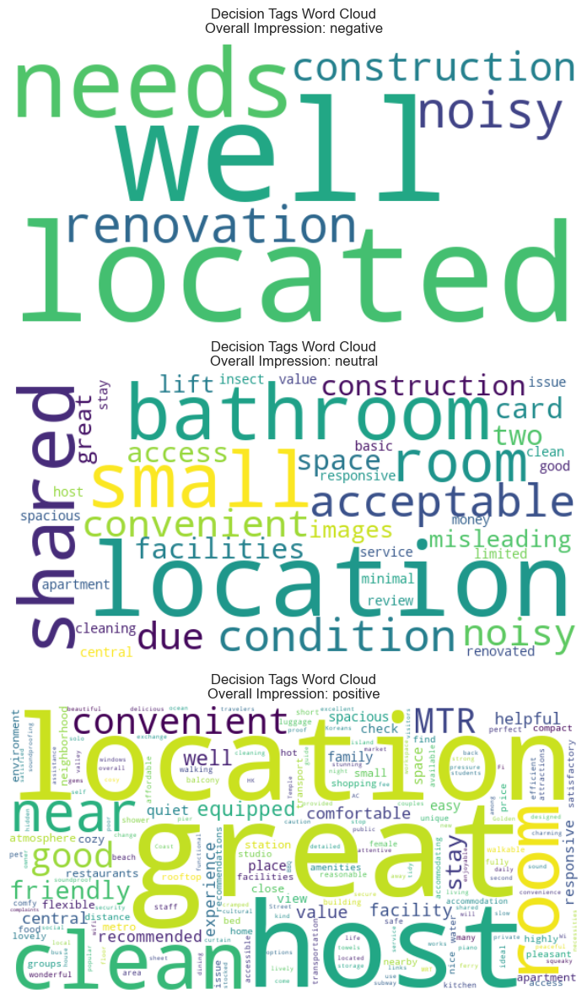

In [96]:
plot_wordclouds_by_overall_impression(all_result)

## What makes people (un)satified with different aspects of the rent?

In [94]:
def plot_wordclouds_by_aspect_opinion(df, aspect_cols, comment_col_prefix='{}_comment'):
    """
    Plot word clouds of comments grouped by opinions for each given aspect.

    Args:
        df (pd.DataFrame): DataFrame containing opinion columns and comment columns.
        aspect_cols (list of str): List of aspect column names, e.g. ['location_opinion', 'facility_opinion', 'host_opinion'].
        comment_col_prefix (str): Pattern to get comment column name from aspect name, default '{}_comment'.
                                  For example, if aspect is 'location_opinion', comment_col is 'location_comment'.
    """
    for aspect in aspect_cols:
        opinions = df[aspect].dropna().unique()
        num_opinions = len(opinions)

        plt.figure(figsize=(6, 3 * num_opinions))
        plt.suptitle(f"Word Clouds of {aspect.replace('_', ' ').capitalize()} Comments by Opinion", fontsize=16)

        comment_col = comment_col_prefix.format(aspect.split('_')[0])  # e.g. 'location_comment'

        for i, opinion in enumerate(sorted(opinions)):
            # Select rows matching the opinion and drop missing comments
            comments = df[df[aspect] == opinion][comment_col].dropna().astype(str)
            text = ' '.join(comments)

            wc = WordCloud(
                width=600,
                height=300,
                background_color='white',
                collocations=False
            ).generate(text)

            plt.subplot(num_opinions, 1, i + 1)
            plt.imshow(wc, interpolation='bilinear')
            plt.axis('off')
            plt.title(f"{opinion.capitalize()}")

        plt.tight_layout(rect=[0, 0, 1, 0.96])  # leave space for suptitle
        plt.show()

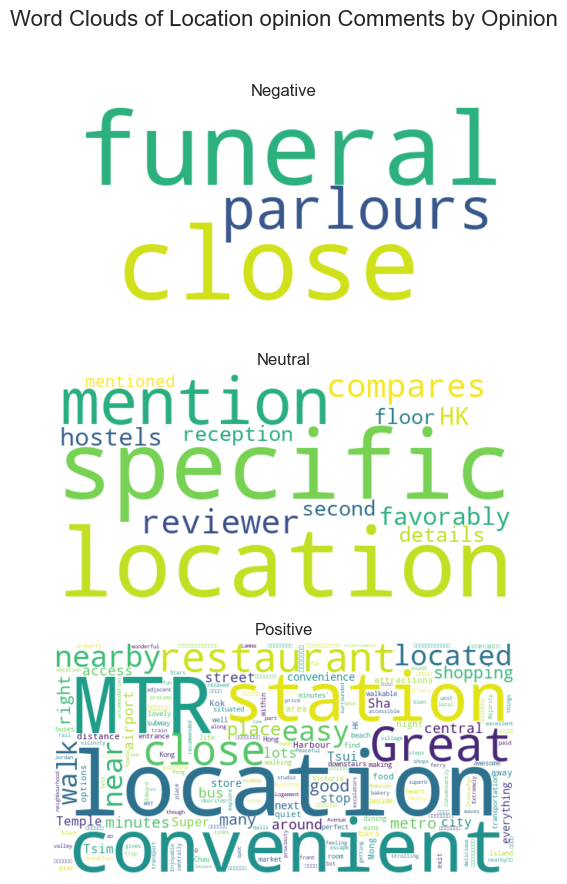

In [91]:
location_col = ['location_opinion']
plot_wordclouds_by_aspect_opinion(all_result, location_col)

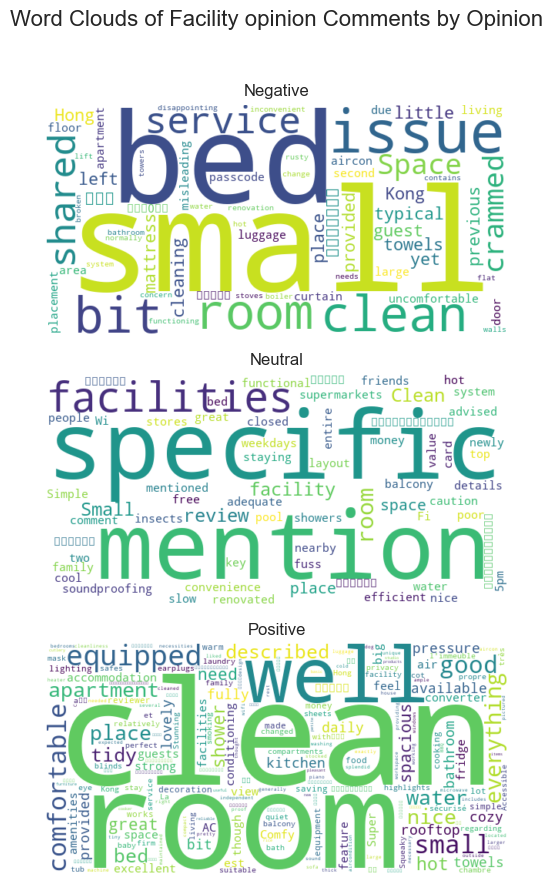

In [92]:
fal_col = ['facility_opinion']
plot_wordclouds_by_aspect_opinion(all_result, fal_col)

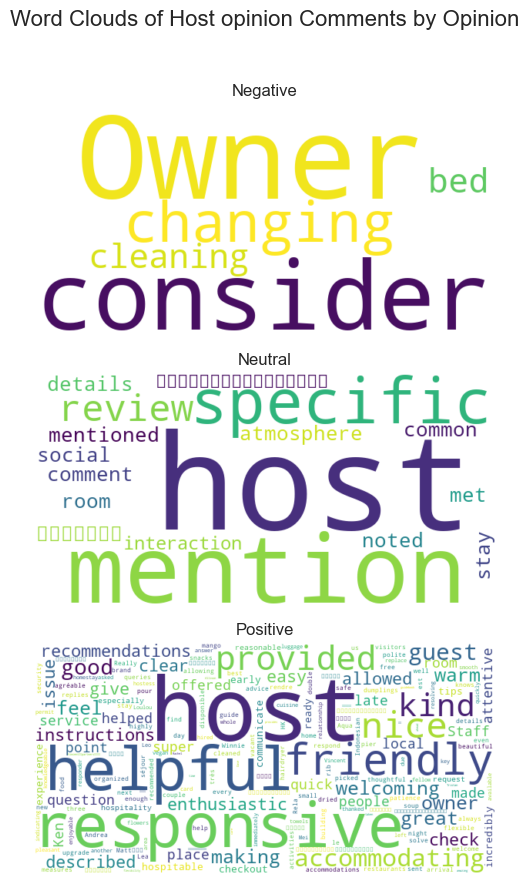

In [93]:
host_col = ['host_opinion']
plot_wordclouds_by_aspect_opinion(all_result, host_col)